In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/metastatic-tissue-classification-patchcamelyon/Metadata/Metadata/valid_metadata.csv
/kaggle/input/metastatic-tissue-classification-patchcamelyon/Metadata/Metadata/train_metadata.csv
/kaggle/input/metastatic-tissue-classification-patchcamelyon/Metadata/Metadata/test_metadata.csv
/kaggle/input/metastatic-tissue-classification-patchcamelyon/Labels/Labels/camelyonpatch_level_2_split_train_y.h5
/kaggle/input/metastatic-tissue-classification-patchcamelyon/Labels/Labels/camelyonpatch_level_2_split_valid_y.h5
/kaggle/input/metastatic-tissue-classification-patchcamelyon/Labels/Labels/camelyonpatch_level_2_split_test_y.h5
/kaggle/input/metastatic-tissue-classification-patchcamelyon/camelyonpatch_level_2_split_train_mask/camelyonpatch_level_2_split_train_mask.h5
/kaggle/input/metastatic-tissue-classification-patchcamelyon/pcam/training_split.h5
/kaggle/input/metastatic-tissue-classification-patchcamelyon/pcam/test_split.h5
/kaggle/input/metastatic-tissue-classification-patchcamelyon

# Set-up

In [3]:
import torch
import torch.nn as nn
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
import timm
from timm.data import resolve_data_config
from timm.data.transforms_factory import create_transform
import numpy as np
import matplotlib.pyplot as plt
import h5py


device = 'cuda'
# device = 'cpu'

In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
# Install Xplique
!pip install -q xplique

# Install Timm
!pip install -q timm

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.


In [6]:
# import h5py
# import torch
# from torch.utils.data import Dataset, DataLoader

# class PCAM_dataset(Dataset):
#     def __init__(self, images_path, labels_path):
#         self.image_file_path = images_path
#         self.labels_file_path = labels_path
#         self.images_file = h5py.File(self.image_file_path, 'r')
#         self.labels_files = h5py.File(self.labels_file_path, 'r')
#         self.images = self.images_file["x"]
#         self.labels = self.labels_files["y"]

#     def __len__(self):
#         return len(self.images)

#     def __getitem__(self, idx):
#         image = self.images[idx]
#         label = self.labels[idx]
#         return image, label[0][0]

# Model definition

In [7]:
model = timm.create_model(
  model_name="hf-hub:1aurent/resnet50.tiatoolbox-pcam",
  pretrained=True,
).eval()
model = model.to(device)

# get model specific transforms (normalization, resize)
data_config = timm.data.resolve_model_data_config(model)
transform = timm.data.create_transform(**data_config, is_training=False)
to_pil = transforms.ToPILImage()

# cut the model in twop arts (as explained in the paper)
# first part is g(.) our 'input_to_latent' model, second part is h(.) our 'latent_to_logit' model
g = nn.Sequential(*(list(model.children())[:8])) # input to penultimate layer
h = nn.Sequential(*(list(model.children())[8:])) # penultimate layer to logits

config.json:   0%|          | 0.00/741 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/94.3M [00:00<?, ?B/s]

# Data preparation

Make a tensor made of all the instances that have a metastasis 

In [8]:
train_images_path = '/kaggle/input/metastatic-tissue-classification-patchcamelyon/pcam/training_split.h5'
train_labels_path = '/kaggle/input/metastatic-tissue-classification-patchcamelyon/Labels/Labels/camelyonpatch_level_2_split_train_y.h5'
# dataset = PCAM_dataset(train_images_path,train_labels_path)
# dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

In [9]:
# Get the indices of the images having a metastasis
labels_file = h5py.File(train_labels_path, 'r')
labels = np.squeeze(labels_file["y"])[:500]
positive_labels_indices = [i for i, value in enumerate(labels) if value == 1]
zero_labels_indices = [i for i, value in enumerate(labels) if value == 0]

# Keep only these positive images
images_file = h5py.File(train_images_path, 'r')
images = np.squeeze(images_file["x"])[:500]
cancerous_images = images[positive_labels_indices]
non_cancerous_images = images[zero_labels_indices]

In [10]:
non_cancerous_images.shape

(240, 96, 96, 3)

In [11]:
cancerous_images.shape

(260, 96, 96, 3)

In [12]:
preprocessed_cancerous_images = torch.stack([transform(to_pil(img)) for img in cancerous_images], 0)
preprocessed_non_cancerous_images = torch.stack([transform(to_pil(img)) for img in non_cancerous_images], 0)
preprocessed_images = torch.stack([transform(to_pil(img)) for img in images], 0) 

In [13]:
preprocessed_cancerous_images.shape

torch.Size([260, 3, 96, 96])

In [14]:
preprocessed_non_cancerous_images.shape

torch.Size([240, 3, 96, 96])

In [15]:
preprocessed_images.shape

torch.Size([500, 3, 96, 96])

In [16]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
      (act2): ReLU(inplace=True)
      (aa): Identity()
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     

# CRAFT for cancerous tissues

In [17]:
from xplique.concepts import CraftTorch as Craft
from xplique.concepts import DisplayImportancesOrder

# Instanciate CRAFT
craft = Craft(input_to_latent_model = g,
              latent_to_logit_model = h,
              number_of_concepts = 5,
              patch_size = 28,
              batch_size = 64,
              device = device)

# now we can start fit the concept using our rabbit images
# CRAFT will:
# 1. Create the patches
# 2. Find the concept (NMF Factorization)
# 3. Return the crops (crops), the embedding of the crops (crops_u),
# and the concept bank (concept_bank_w)

crops, crops_u, concept_bank_w = \
  craft.fit(preprocessed_cancerous_images, class_id= 1)

crops.shape, crops_u.shape, concept_bank_w.shape

2024-04-08 09:47:00.441344: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-08 09:47:00.441471: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-08 09:47:00.601958: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
/opt/conda/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


((4160, 3, 28, 28), (4160, 5), (5, 2048))

In [18]:
importances = craft.estimate_importance()

## Display results

### Display the concepts for a specific image

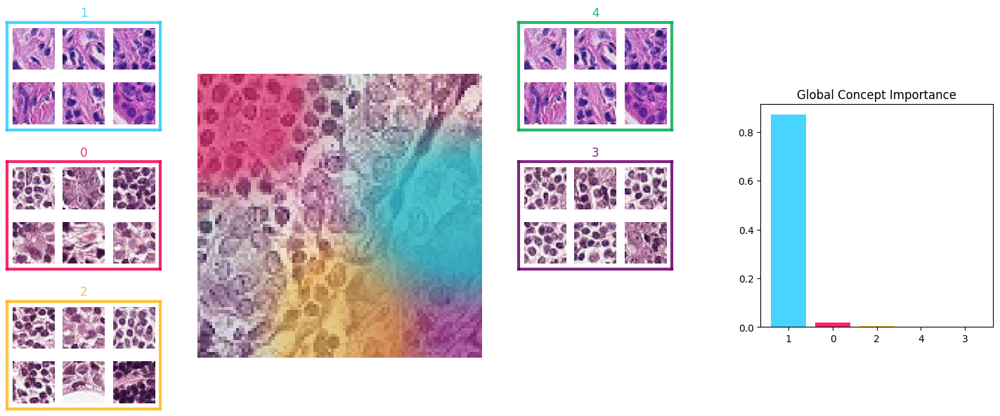

In [19]:
# Plot the attribution map for 1 image, and the concepts associated to
# the class around it, ordered by global importance
craft.plot_image_concepts(preprocessed_cancerous_images[0].cpu())

### Display the importance of each concept

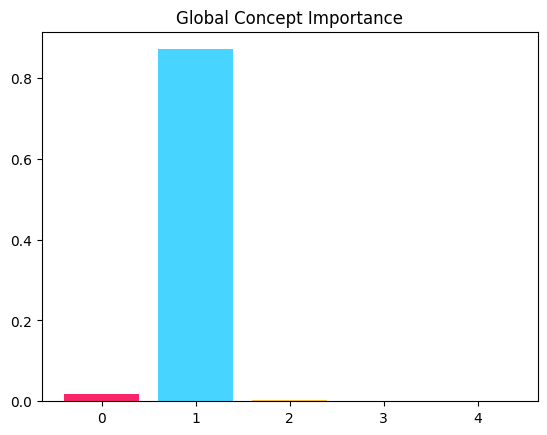

In [20]:
# Let's see which concepts matter

# Plot the importance values.
craft.plot_concepts_importances()

### Show the best crops for each concept

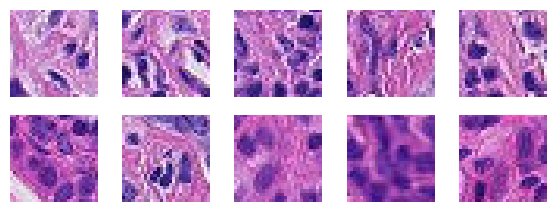

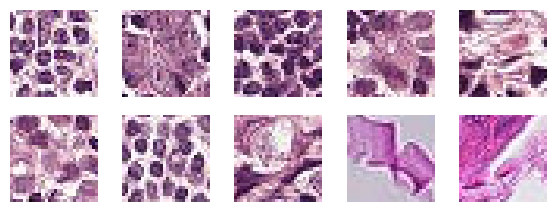

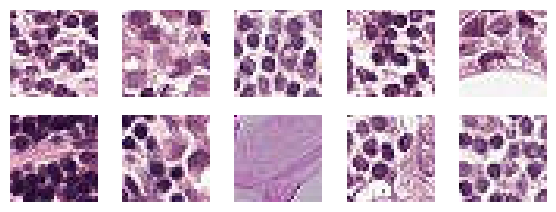

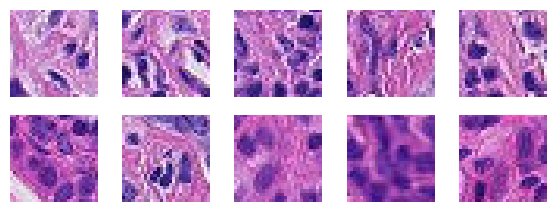

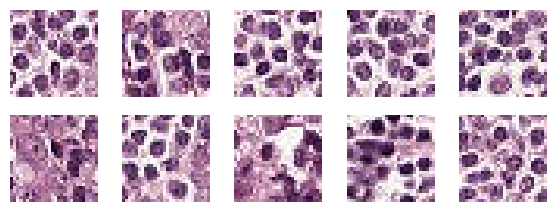

In [21]:
# Let's inspect those concepts by showing the 10 best crops for each concept.
# Limit the display to the 5 most important concepts.
craft.plot_concepts_crops(nb_crops=10, nb_most_important_concepts=5)

### Plot the concept attribution map for several images

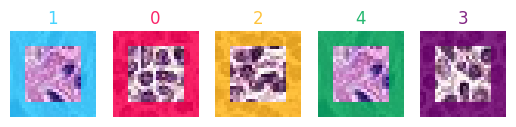

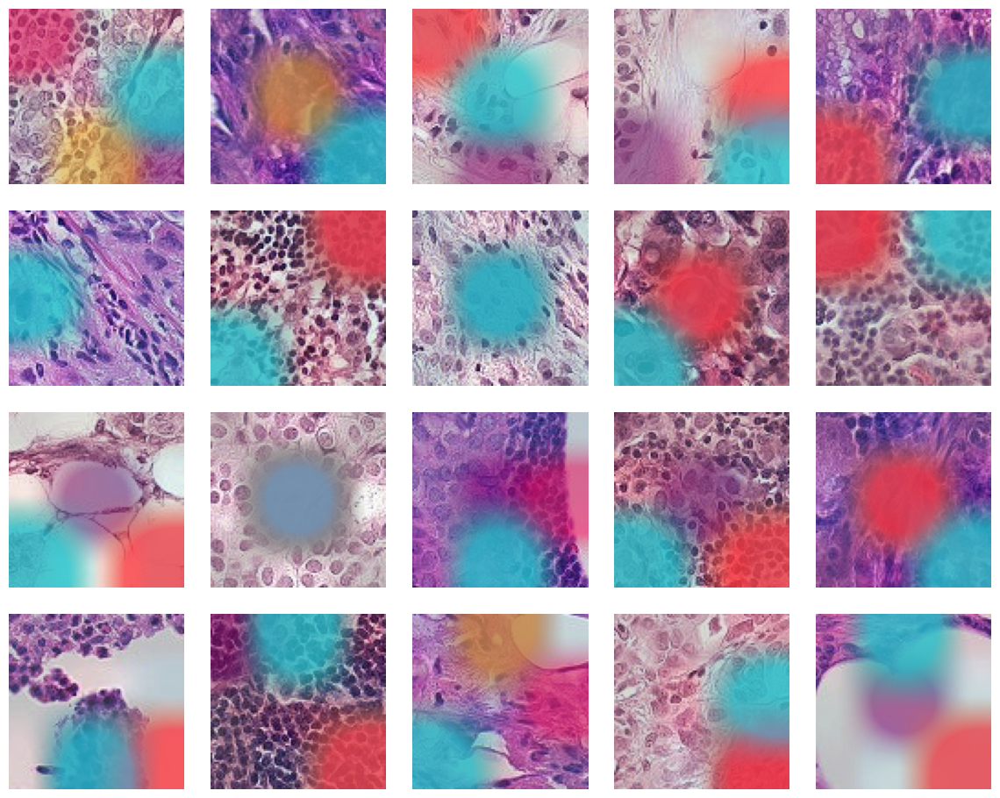

In [22]:
# Display the attribution map for 20 images.
# Limit the display to the 5 most important concepts.
craft.plot_concept_attribution_maps(preprocessed_cancerous_images[0:20].cpu(),
                                    nb_most_important_concepts=5)

### Display everything in 1 single plot

In [23]:
preprocessed_cancerous_images.shape

torch.Size([260, 3, 96, 96])

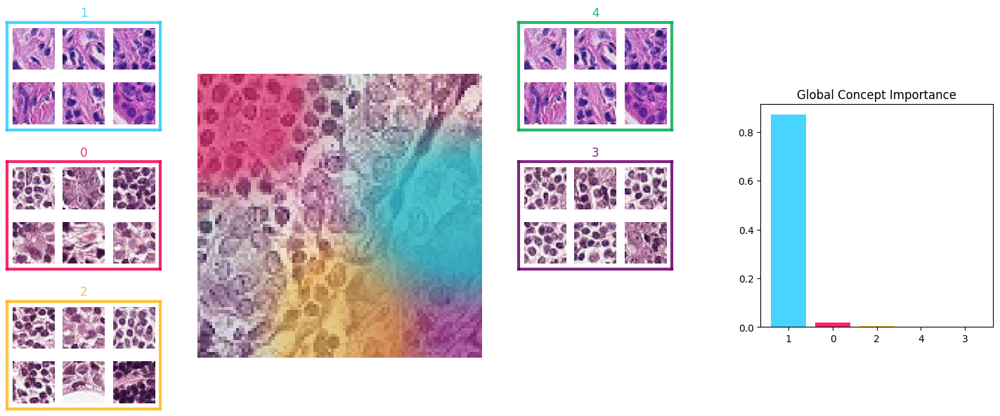

In [24]:
# Plot the attribution map for 1 image, and the concepts associated to
# the class around ordered by global importance
from xplique.concepts import DisplayImportancesOrder
craft.plot_image_concepts(preprocessed_cancerous_images[0].cpu(), DisplayImportancesOrder.GLOBAL)

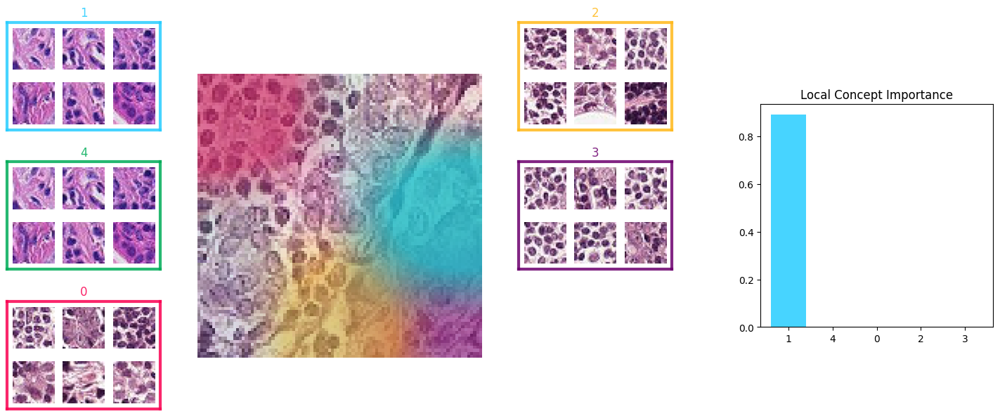

In [25]:
# Plot the attribution map for 1 image, and the concepts associated to
# the class, ordered by importantce for this image
craft.plot_image_concepts(preprocessed_cancerous_images[0].cpu(), DisplayImportancesOrder.LOCAL)

# CRAFT for non-cancerous tissues

In [26]:
from xplique.concepts import CraftTorch as Craft
from xplique.concepts import DisplayImportancesOrder

# Instanciate CRAFT
craft = Craft(input_to_latent_model = g,
              latent_to_logit_model = h,
              number_of_concepts = 10,
              patch_size = 28,
              batch_size = 64,
              device = device)

# now we can start fit the concept using our rabbit images
# CRAFT will:
# 1. Create the patches
# 2. Find the concept (NMF Factorization)
# 3. Return the crops (crops), the embedding of the crops (crops_u),
# and the concept bank (concept_bank_w)

crops, crops_u, concept_bank_w = \
  craft.fit(preprocessed_non_cancerous_images, class_id= 0)

crops.shape, crops_u.shape, concept_bank_w.shape

/opt/conda/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


((3840, 3, 24, 24), (3840, 10), (10, 2048))

In [27]:
importances = craft.estimate_importance()

## Display results

### Display the concepts for a specific image

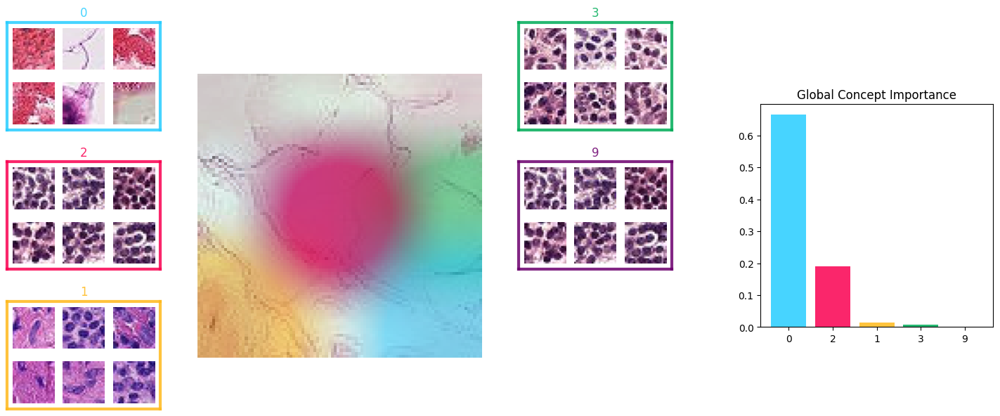

In [28]:
# Plot the attribution map for 1 image, and the concepts associated to
# the class around it, ordered by global importance
craft.plot_image_concepts(preprocessed_non_cancerous_images[21].cpu())

### Display the importance of each concept

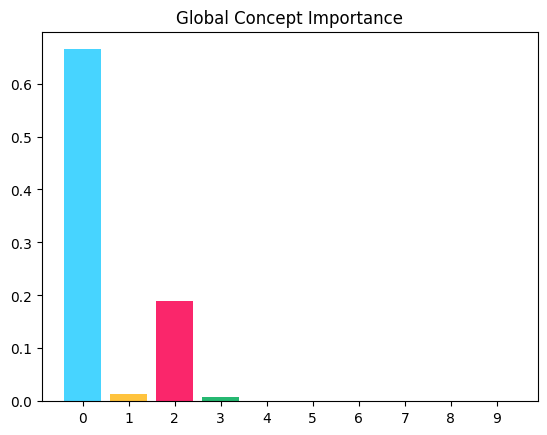

In [29]:
# Let's see which concepts matter

# Plot the importance values.
craft.plot_concepts_importances()

### Show the best crops for each concept

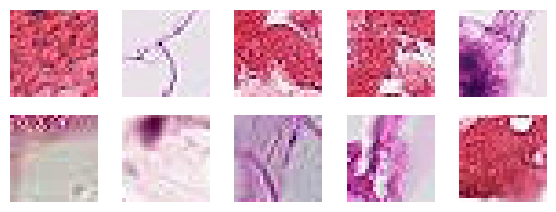

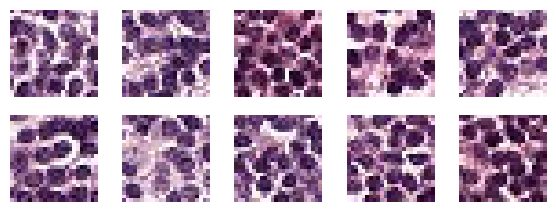

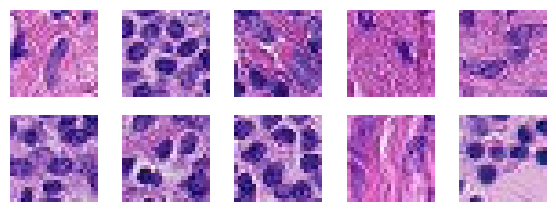

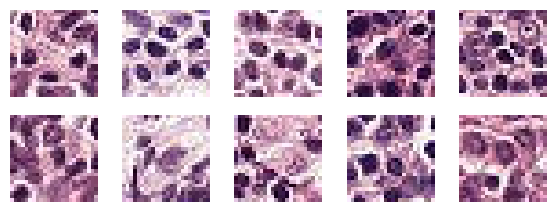

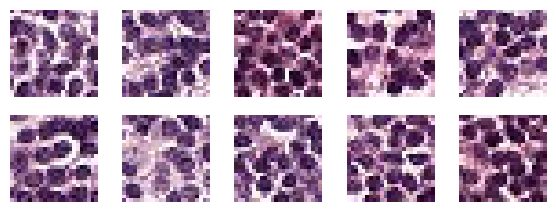

In [30]:
# Let's inspect those concepts by showing the 10 best crops for each concept.
# Limit the display to the 5 most important concepts.
craft.plot_concepts_crops(nb_crops=10, nb_most_important_concepts=5)

### Plot the concept attribution map for several images

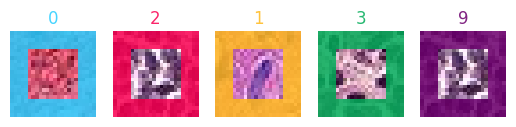

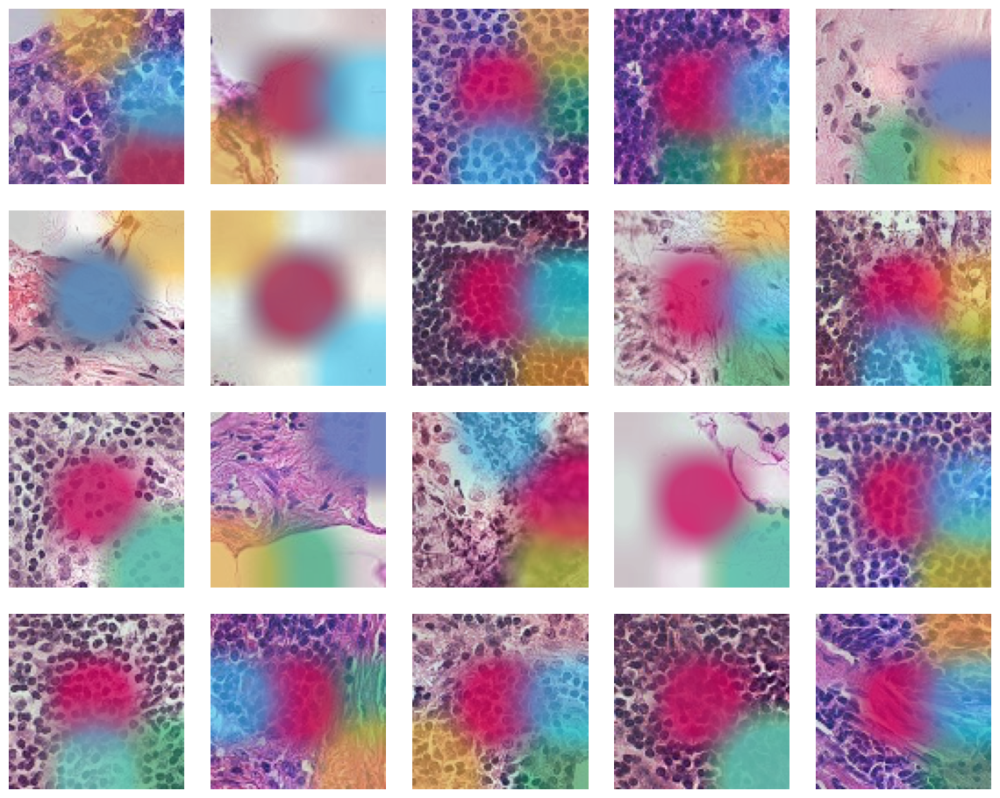

In [31]:
# Display the attribution map for 20 images.
# Limit the display to the 5 most important concepts.
craft.plot_concept_attribution_maps(preprocessed_non_cancerous_images[0:20].cpu(),
                                    nb_most_important_concepts=5)

### Display everything in 1 single plot

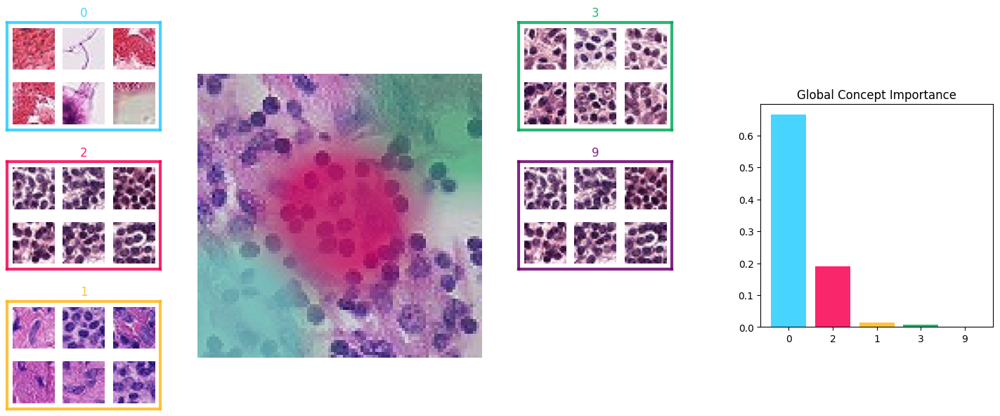

In [32]:
# Plot the attribution map for 1 image, and the concepts associated to
# the class around ordered by global importance
from xplique.concepts import DisplayImportancesOrder
craft.plot_image_concepts(preprocessed_non_cancerous_images[29].cpu(), DisplayImportancesOrder.GLOBAL)

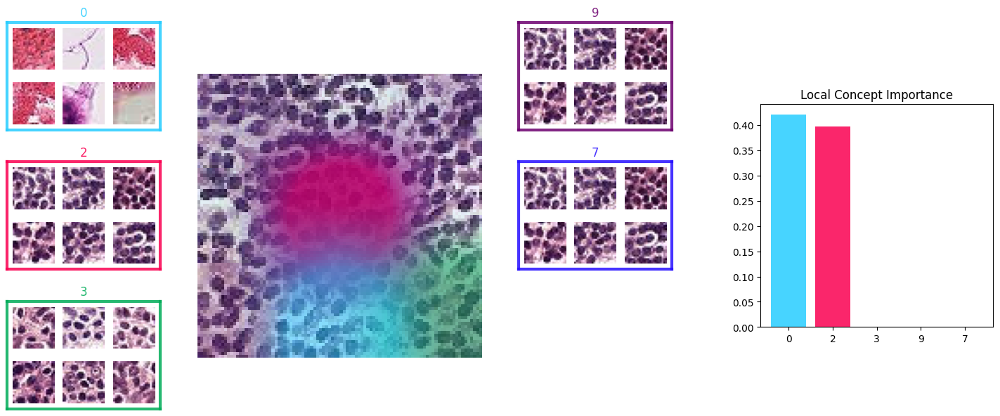

In [33]:
# Plot the attribution map for 1 image, and the concepts associated to
# the class, ordered by importantce for this image
craft.plot_image_concepts(preprocessed_non_cancerous_images[15].cpu(), DisplayImportancesOrder.LOCAL)

# Correct classification and misclassification

## Craft manager

In [34]:
from xplique.concepts import CraftManagerTorch as CraftManager
from xplique.concepts import DisplayImportancesOrder

# The instanciation of the Craft Manager is similar as Craft, but this
# time we need to pass the whole dataset (inputs, labels) as well
# as a list of classes of interest. If no list of classes of interest
# are provided, then all the classes of the dataset will be used.
# The Craft Manager will instanciate one Craft object per class of
# interest.


cm = CraftManager(input_to_latent_model = g,
              latent_to_logit_model = h,
              number_of_concepts = 5,
              patch_size = 28,
              batch_size = 64,
              inputs = preprocessed_images,
              labels = labels,
              list_of_class_of_interest = [0,1],
              device=device)

# Fit all the instances of CRAFT on their own class subset,
# and limit the number of samples to use to 10 per class
cm.fit(nb_samples_per_class=100)

/opt/conda/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


In [35]:
# Compute the concepts importances for all the classes of interest
cm.estimate_importance()

In [36]:
# Compute the output of the model on our dataset
from xplique.concepts.craft_torch import _batch_inference
model = model.to(device)

preds = _batch_inference(model, preprocessed_images, device=device)
y_preds = np.array(torch.argmax(preds, -1).cpu().detach().numpy())

# Separate correct predictions and wrong predictions
correct_predictions = (y_preds == labels)
idx_correct_predictions = np.where(correct_predictions)[0]

wrong_predictions = (y_preds != labels)
idx_wrong_predictions = np.where(wrong_predictions)[0]

## Correct classification

real label : 0, predicted label = 0


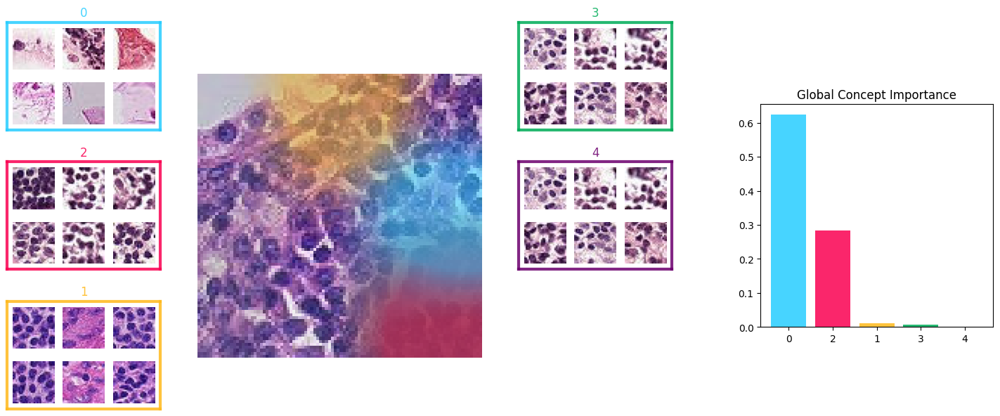

real label : 1, predicted label = 1


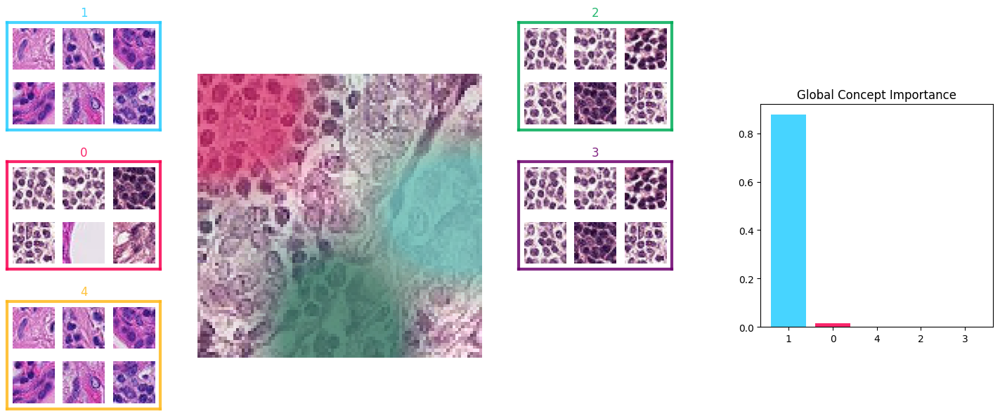

real label : 1, predicted label = 1


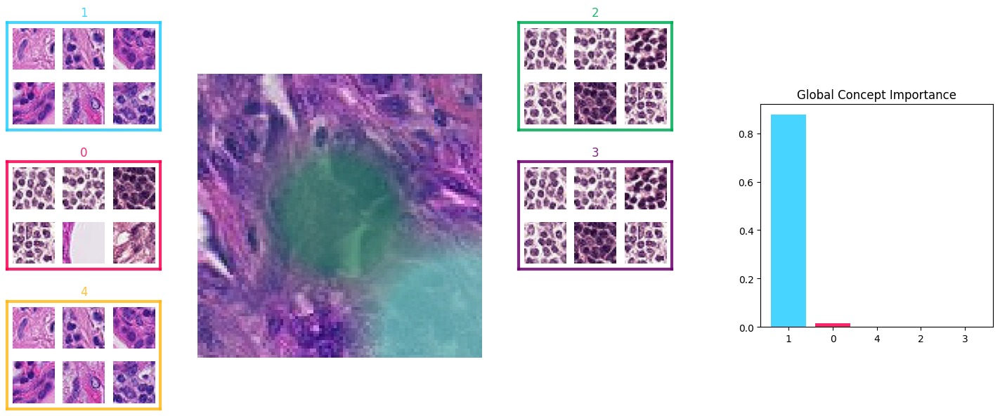

real label : 1, predicted label = 1


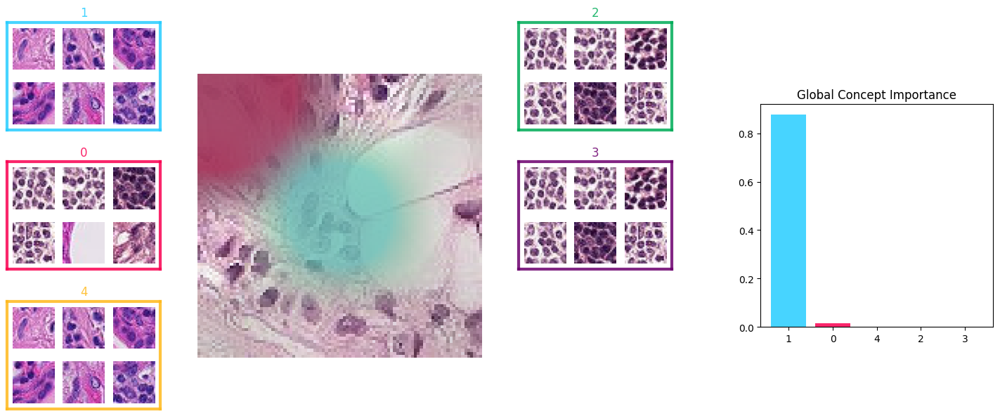

real label : 0, predicted label = 0


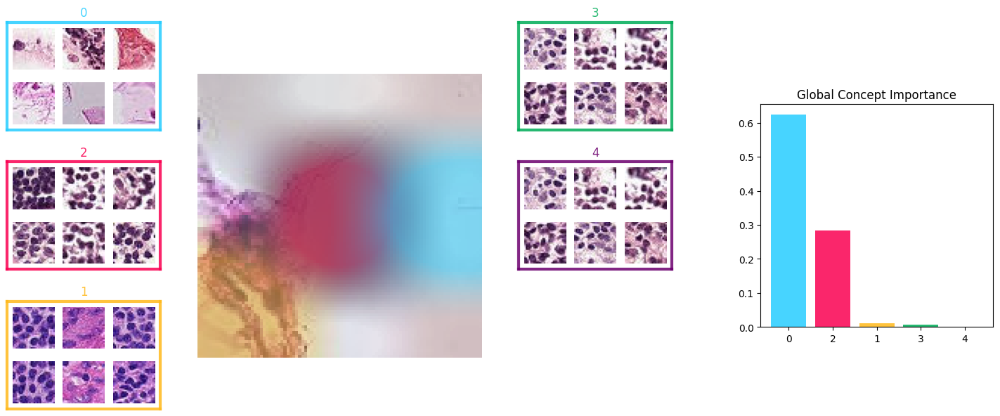

real label : 0, predicted label = 0


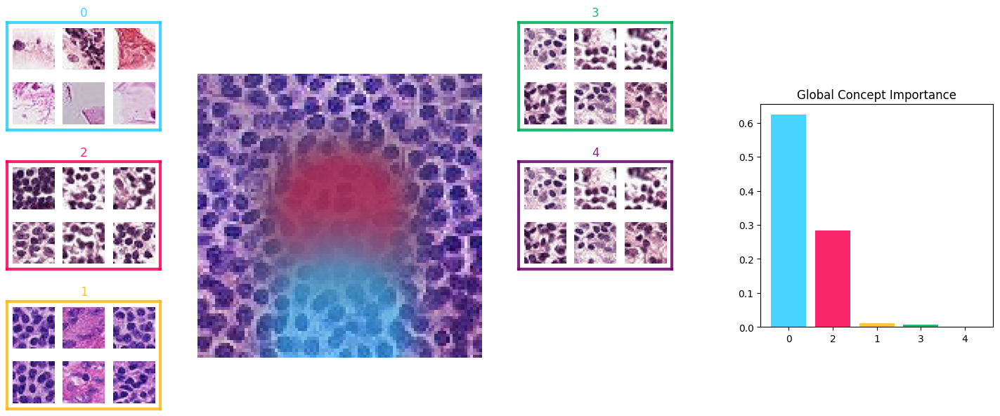

real label : 0, predicted label = 0


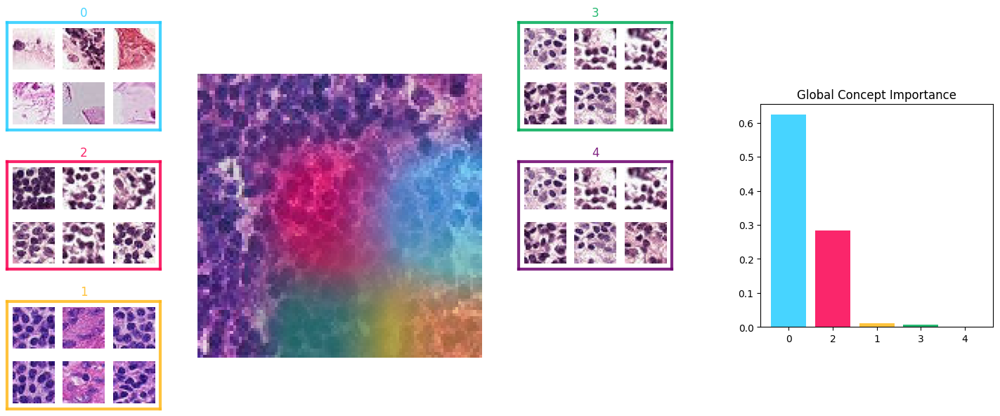

real label : 1, predicted label = 1


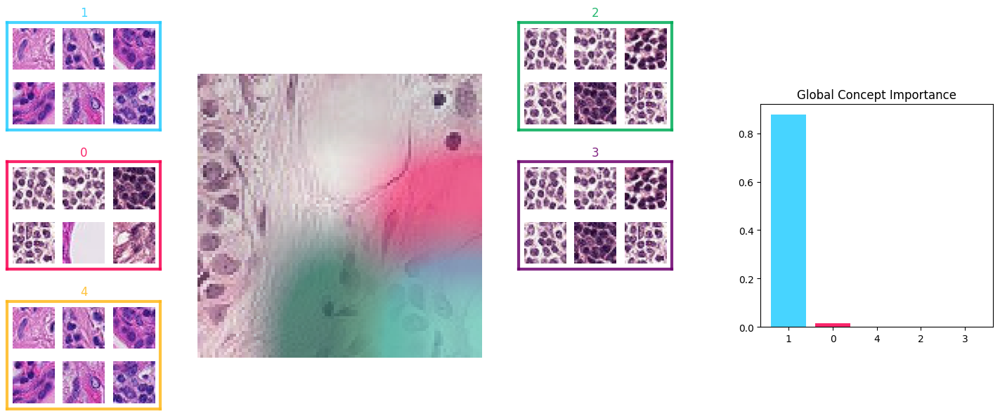

real label : 1, predicted label = 1


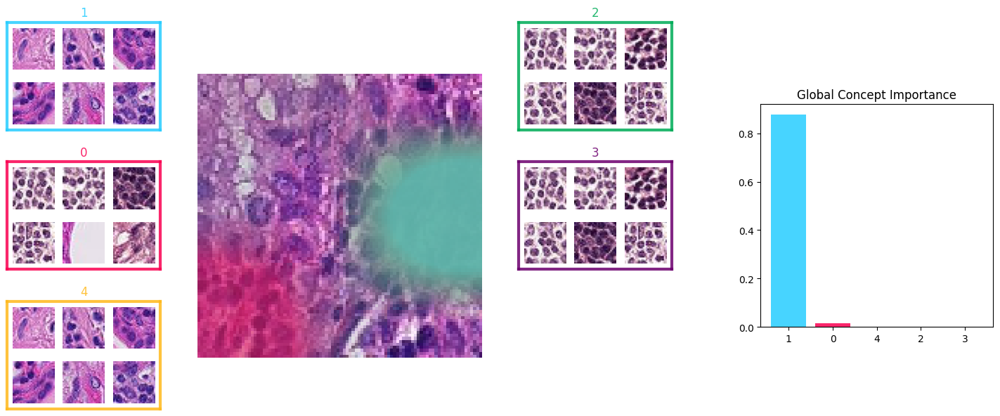

real label : 1, predicted label = 1


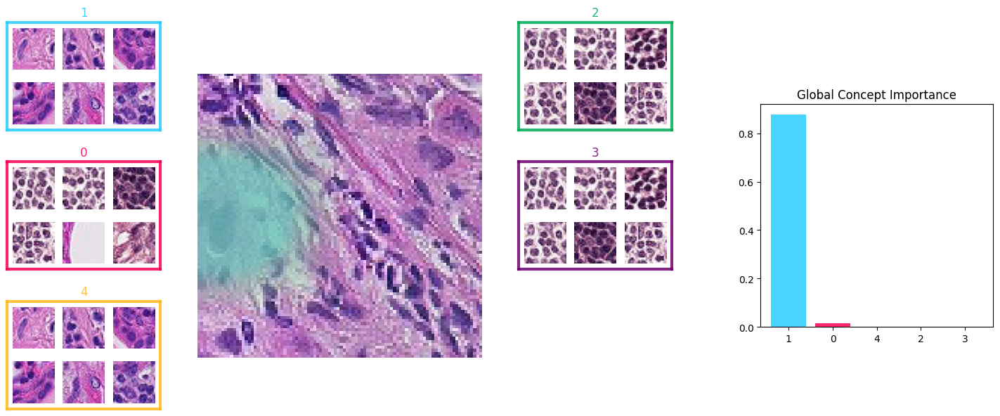

In [37]:
# for idx in idx_correct_predictions[[2411]]:
for idx in idx_correct_predictions[:10]:
    print(f"real label : {labels[idx]}, predicted label = {y_preds[idx]}")
    cm.plot_image_concepts(preprocessed_images[idx].cpu(), class_id=y_preds[idx],
                           display_importance_order=DisplayImportancesOrder.GLOBAL)

## False classification

real label : 0, predicted label = 1


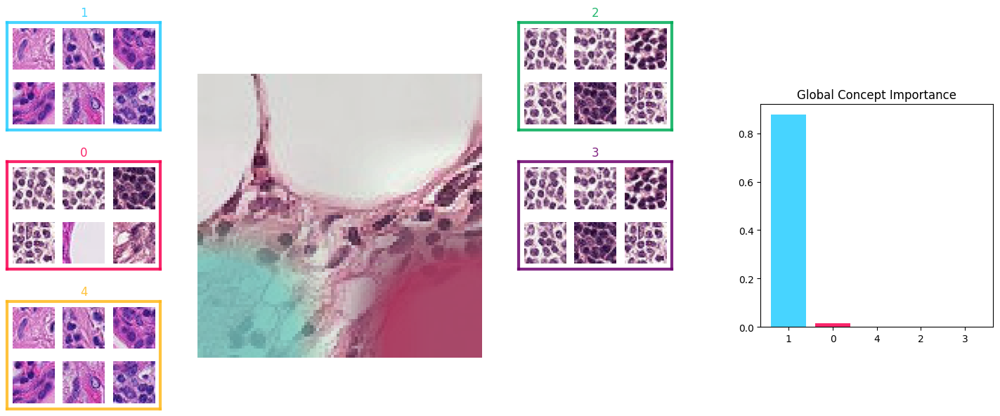

real label : 0, predicted label = 1


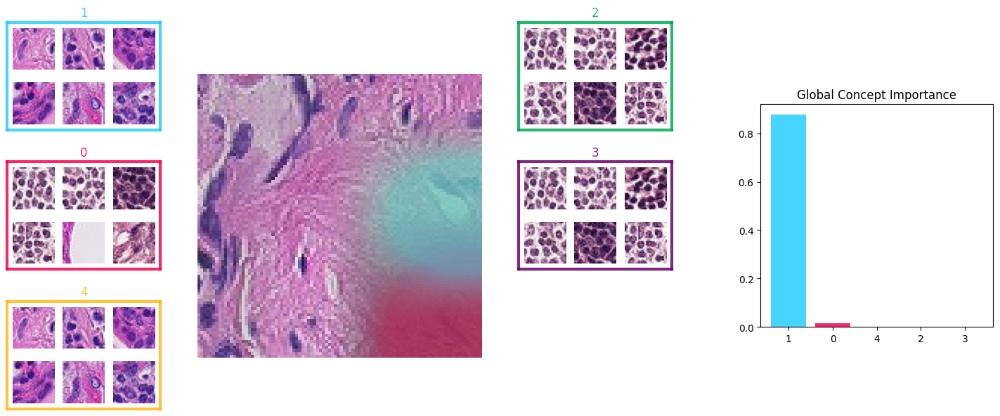

real label : 1, predicted label = 0


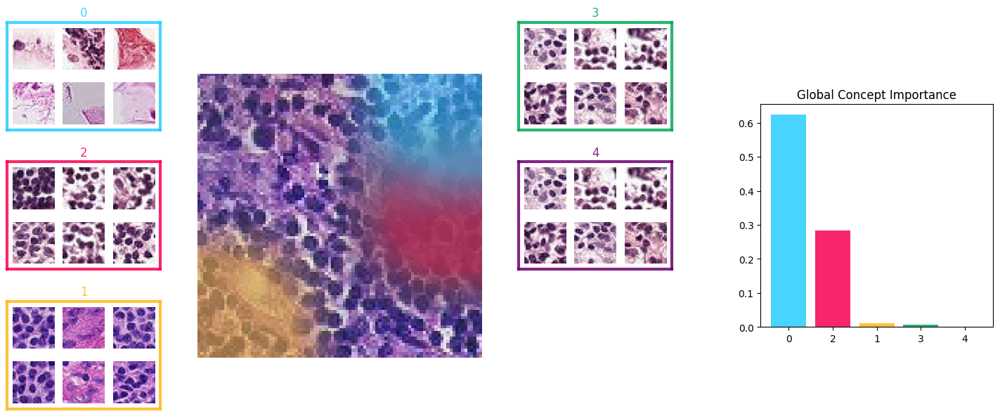

real label : 0, predicted label = 1


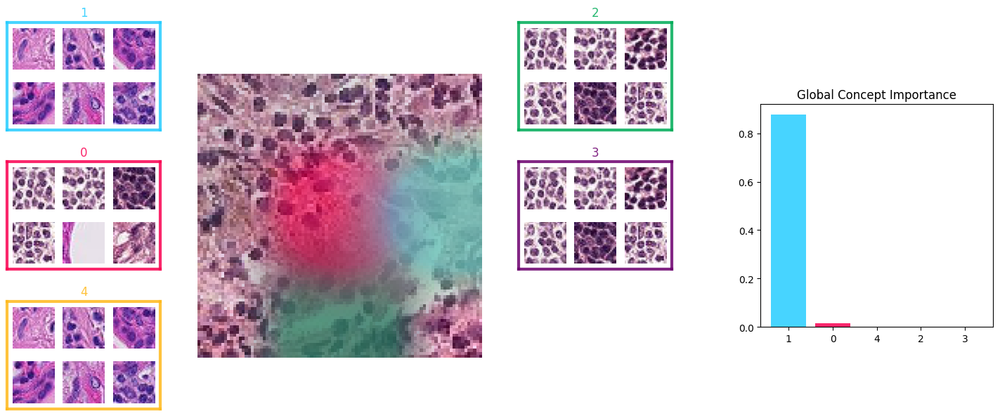

real label : 0, predicted label = 1


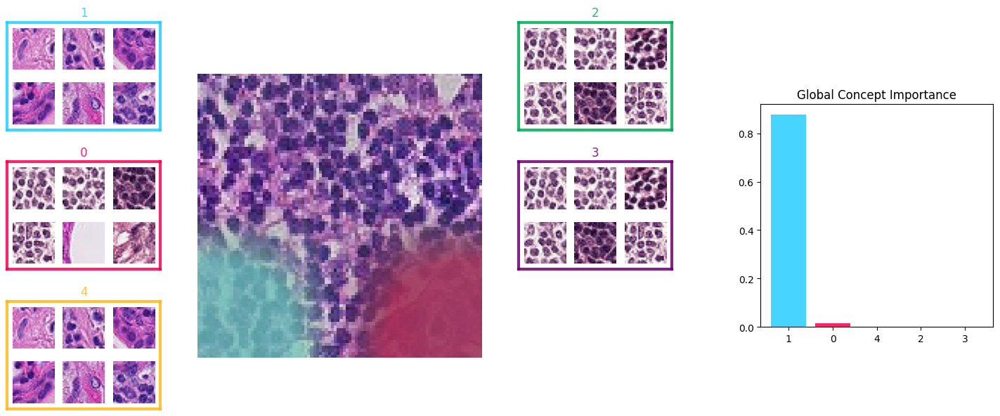

real label : 1, predicted label = 0


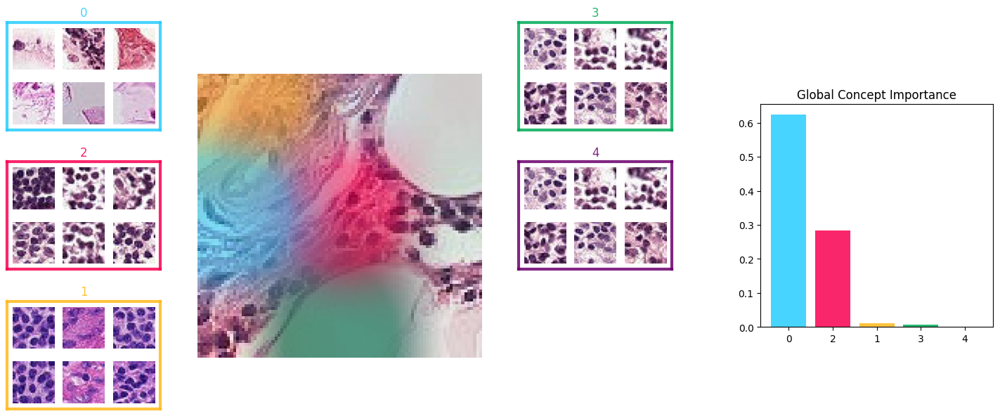

real label : 1, predicted label = 0


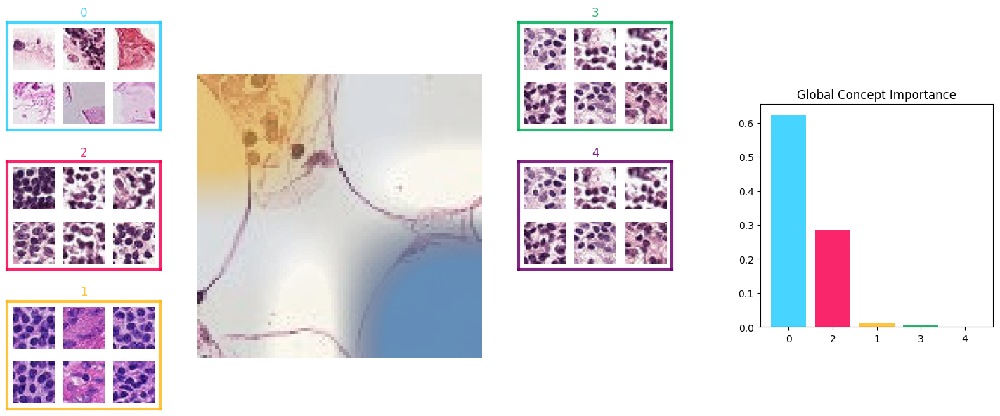

real label : 1, predicted label = 0


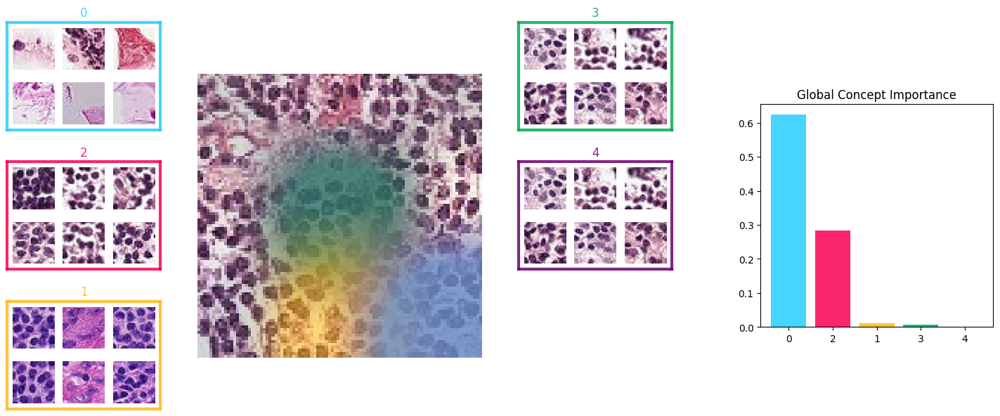

real label : 0, predicted label = 1


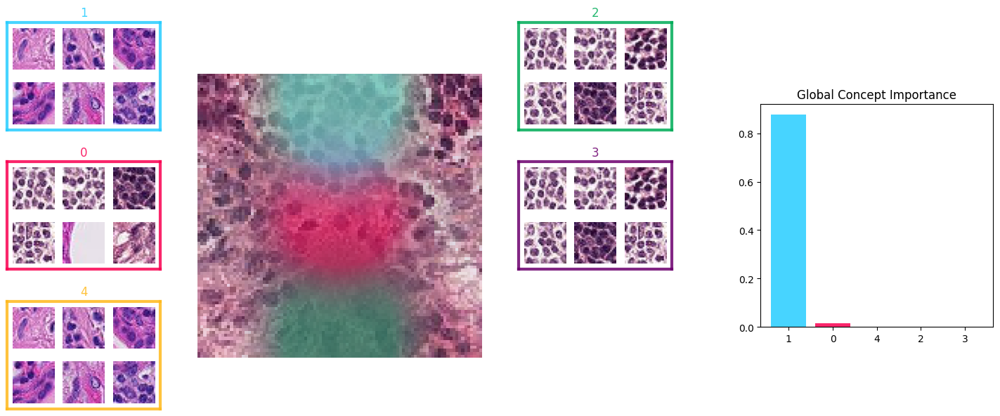

In [38]:
# for idx in idx_wrong_predictions_of_interest:
for idx in idx_wrong_predictions:
    
    print(f"real label : {labels[idx]}, predicted label = {y_preds[idx]}")
    cm.plot_image_concepts(preprocessed_images[idx].cpu(), y_preds[idx], DisplayImportancesOrder.GLOBAL)